# Renewable Energy Data EDA (postcode + battery)

### Import to dataframes

In [6]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import geopandas as gpd
import folium
import seaborn as sns
import os

pd.set_option('display.max_rows', None)

# Get parent directory i.e. where the repo is cloned from there we can access the data folder
base_dir = os.path.abspath(os.path.join(os.getcwd(), os.pardir))+'/'


# Postcode data (SSI = small scale installations, SGU = small generation unit, SWH = Solar water heating )
df_SSI_SGU_Hydro = pd.read_csv(base_dir+"0_datasets/Postcode data for small-scale installations - SGU-Hydro.csv")
df_SSI_SGU_Solar = pd.read_csv(base_dir+"0_datasets/Postcode data for small-scale installations - SGU-Solar.csv")
df_SSI_SGU_Wind = pd.read_csv(base_dir+"0_datasets/Postcode data for small-scale installations - SGU-Wind.csv")
df_SSI_SWH_Air_source_heat_pump = pd.read_csv(base_dir+"0_datasets/Postcode data for small-scale installations - SWH-Air-source-heat-pump.csv")
df_SSI_SWH_Solar = pd.read_csv(base_dir+"0_datasets/Postcode data for small-scale installations - SWH-Solar.csv")

# Battery installations with SSI by state
df_battery_installations = pd.read_csv(base_dir+"0_datasets/State data for battery installations with small-scale systems.csv")

# Australian postcode data reference dataset
df_AU_postcode_dataset = pd.read_excel(base_dir+"0_datasets/australian_postcodes.xlsx")

# Whole REC database (REC = renewable energy certificate)
df_REC_database = pd.read_csv(base_dir+"0_datasets/wholeRECdatabase_20230816_no_dups.csv",encoding='cp1252')

In [7]:
df_list = [
df_SSI_SGU_Hydro,
df_SSI_SGU_Solar,
df_SSI_SGU_Wind,
df_SSI_SWH_Air_source_heat_pump,
df_SSI_SWH_Solar,
df_battery_installations,
df_AU_postcode_dataset,
df_REC_database
]

for idx, df in enumerate(df_list, start=1):
    print(f"DataFrame {idx} - Name: {df.name if hasattr(df, 'name') else 'Unnamed'}, Shape: {df.shape}")

DataFrame 1 - Name: Unnamed, Shape: (20, 7)
DataFrame 2 - Name: Unnamed, Shape: (2806, 41)
DataFrame 3 - Name: Unnamed, Shape: (253, 5)
DataFrame 4 - Name: Unnamed, Shape: (2610, 21)
DataFrame 5 - Name: Unnamed, Shape: (2964, 21)
DataFrame 6 - Name: Unnamed, Shape: (10, 10)
DataFrame 7 - Name: Unnamed, Shape: (18513, 33)
DataFrame 8 - Name: Unnamed, Shape: (7190252, 17)


In [8]:
df_REC_database.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7190252 entries, 0 to 7190251
Data columns (total 17 columns):
 #   Column                       Dtype  
---  ------                       -----  
 0   Status                       object 
 1   Owner                        object 
 2   Accreditation_Code           object 
 3   Fuel_Source_Active           bool   
 4   Fuel_Source_Type             object 
 5   Fuel_Source_Display_Name     object 
 6   Generation_Year              int64  
 7   Status.1                     object 
 8   Start_Serial                 float64
 9   End_Serial                   float64
 10  State                        object 
 11  Owner_Name                   object 
 12  Creation_Year                int64  
 13  Range_ID                     int64  
 14  Creation_Date                object 
 15  Public_Registered_Person_ID  int64  
 16  Created_By                   object 
dtypes: bool(1), float64(2), int64(4), object(10)
memory usage: 884.6+ MB


In [9]:
df_compare_systems = pd.DataFrame([], columns=['Type','Locations','System Quantity', 'KW'])

In [10]:
sgu_hydro = df_SSI_SGU_Hydro["Small Unit Installation Postcode"].drop_duplicates()

postcodes = sgu_hydro.shape[0]
quantity = sum(df_SSI_SGU_Hydro["Previous Years (2001-2021) - Installation Quantity"])
kw = round(sum(df_SSI_SGU_Hydro["Previous Years (2001-2021) - SGU Output Rated Output In kW"]),2)

print(postcodes, "unique hydro postcodes")
print(quantity, "total hydro units")
print(kw , "total hydro kw")

hydro_df = pd.DataFrame([["Hydro",postcodes, quantity, kw]],columns=['Type', 'Locations','System Quantity', 'KW'])
df_compare_systems = pd.concat([df_compare_systems, hydro_df])
df_compare_systems



20 unique hydro postcodes
20 total hydro units
50.7 total hydro kw


,Type,Locations,System Quantity,KW
0,Hydro,20,20,50.7


In [11]:
sgu_solar = df_SSI_SGU_Solar["Small Unit Installation Postcode"].drop_duplicates()

postcodes = sgu_solar.shape[0]
quantity = sum(df_SSI_SGU_Solar["Previous Years (2001-2021) - Installation Quantity"])
kw = round(sum(df_SSI_SGU_Solar["Previous Years (2001-2021) - SGU Output Rated Output In kW"]),2)

print(postcodes, "unique solar postcodes")
print(quantity, "total solar units")
print(kw , "total solar kw")

solar_df = pd.DataFrame([["Solar",postcodes, quantity, kw]],columns=['Type', 'Locations','System Quantity', 'KW'])
df_compare_systems = pd.concat([df_compare_systems, solar_df])
df_compare_systems


2806 unique solar postcodes
3073708 total solar units
16519611.88 total solar kw


,Type,Locations,System Quantity,KW
0,Hydro,20,20,50.70
0,Solar,2806,3073708,16519611.88


In [12]:
sgu_wind = df_SSI_SGU_Wind["Small Unit Installation Postcode"].drop_duplicates()

postcodes = sgu_wind.shape[0]
quantity = sum(df_SSI_SGU_Wind["Previous Years (2001-2021) - Installation Quantity"])
kw = round(sum(df_SSI_SGU_Wind["Previous Years (2001-2021) - SGU Output Rated Output In kW"]),2)

print(postcodes, "unique wind postcodes")
print(quantity, "total wind units")
print(kw , "total wind kw")

wind_df = pd.DataFrame([["Wind",postcodes, quantity, kw]],columns=['Type', 'Locations','System Quantity', 'KW'])
df_compare_systems = pd.concat([df_compare_systems, wind_df])
df_compare_systems


253 unique wind postcodes
424 total wind units
1468.67 total wind kw


,Type,Locations,System Quantity,KW
0,Hydro,20,20,50.70
0,Solar,2806,3073708,16519611.88
0,Wind,253,424,1468.67


In [13]:
swh_hp = df_SSI_SWH_Air_source_heat_pump["Small Unit Installation Postcode"].drop_duplicates()

postcodes = swh_hp.shape[0]
quantity = sum(df_SSI_SWH_Air_source_heat_pump["Previous Years (2001-2021) - Installation Quantity"])
kw = 0 # no kw column

print(postcodes, "unique heat-pump postcodes")
print(quantity, "total heat-pump units")
print(kw , "total heat-pump kw")

hp_df = pd.DataFrame([["Heat-pump",postcodes, quantity, kw]],columns=['Type', 'Locations','System Quantity', 'KW'])
df_compare_systems = pd.concat([df_compare_systems, hp_df])
df_compare_systems


2610 unique heat-pump postcodes
365635 total heat-pump units
0 total heat-pump kw


,Type,Locations,System Quantity,KW
0,Hydro,20,20,50.70
0,Solar,2806,3073708,16519611.88
0,Wind,253,424,1468.67
0,Heat-pump,2610,365635,0.00


In [14]:
swh_solar = df_SSI_SWH_Solar["Small Unit Installation Postcode"].drop_duplicates()

postcodes = swh_solar.shape[0]
quantity = sum(df_SSI_SWH_Solar["Previous Years (2001-2021) - Installation Quantity"])
kw = 0 # no kw column

print(postcodes, "unique swh-solar postcodes")
print(quantity, "total swh-solar units")
print(kw , "total swh-solar kw")

swh_solar_df = pd.DataFrame([["SWH-Solar",postcodes, quantity, kw]],columns=['Type', 'Locations','System Quantity', 'KW'])
df_compare_systems = pd.concat([df_compare_systems, swh_solar_df])
df_compare_systems


2964 unique swh-solar postcodes
1036390 total swh-solar units
0 total swh-solar kw


,Type,Locations,System Quantity,KW
0,Hydro,20,20,50.70
0,Solar,2806,3073708,16519611.88
0,Wind,253,424,1468.67
0,Heat-pump,2610,365635,0.00
0,SWH-Solar,2964,1036390,0.00


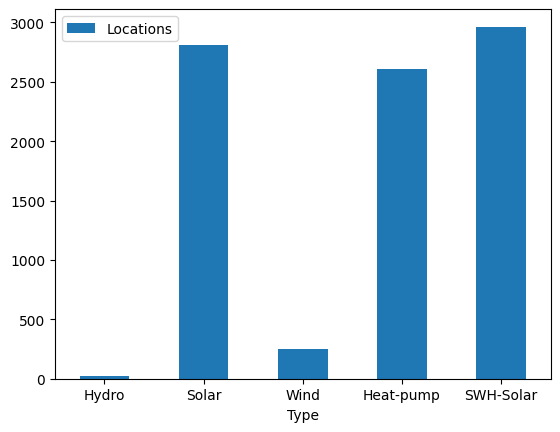

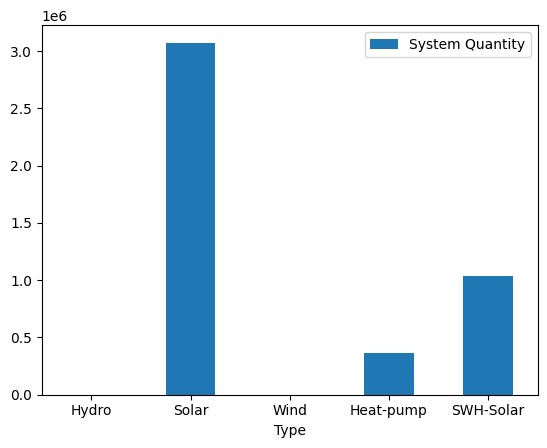

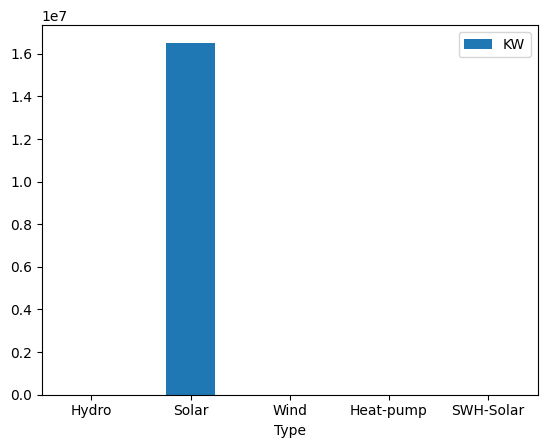

In [15]:
df_compare_systems[["Locations","System Quantity","KW"]] = df_compare_systems[["Locations","System Quantity","KW"]].apply(pd.to_numeric)
Locations_graph = df_compare_systems.plot.bar(x='Type', y='Locations', rot=0)
System_Quantity_graph = df_compare_systems.plot.bar(x='Type', y='System Quantity', rot=0)
kW_graph = df_compare_systems.plot.bar(x='Type', y='KW', rot=0)


### From this, there are two questions:

1- Do swh units not produce KW or is it simply not included in the datset?

2- Is the observed KW value already calculated based on the system quantity, or should the two be multiplied to find the overall kw production per postcode?


### The main observations

1- Most locations that have solar panels will also have a solar water heating which makes intuitive sense.

2- In a given household you may have 1 heat pump and 1 SWH-solar but many panels which explains the quantity difference.

3- It's very rare for residential properties to have wind or hydro which explains the low numbers compared to solar.

4- Between 2001 and 2021 (The last 20 years), Australian residents installed around 16 Million kW of solar energy, 1500kW of Wind energy, and 50kW of hydro energy.


Creating a combined postcode dataset

In [16]:
swh_solar_df = pd.DataFrame([["SWH-Solar",postcodes, quantity, kw]],columns=['Type', 'Locations','System Quantity', 'KW'])

df_compare_systems = pd.concat([df_compare_systems, swh_solar_df])

df_SSI_SGU_Hydro_small = df_SSI_SGU_Hydro[['Small Unit Installation Postcode','Previous Years (2001-2021) - Installation Quantity','Previous Years (2001-2021) - SGU Output Rated Output In kW']]
df_SSI_SGU_Solar_small = df_SSI_SGU_Solar[['Small Unit Installation Postcode','Previous Years (2001-2021) - Installation Quantity','Previous Years (2001-2021) - SGU Output Rated Output In kW']]
df_SSI_SGU_Wind_small = df_SSI_SGU_Wind[['Small Unit Installation Postcode','Previous Years (2001-2021) - Installation Quantity','Previous Years (2001-2021) - SGU Output Rated Output In kW']]
df_SSI_SWH_Air_source_heat_pump_small = df_SSI_SWH_Air_source_heat_pump[['Small Unit Installation Postcode','Previous Years (2001-2021) - Installation Quantity']]
df_SSI_SWH_Solar_small = df_SSI_SWH_Solar[['Small Unit Installation Postcode','Previous Years (2001-2021) - Installation Quantity']]

df_SSI_SGU_Hydro_small2= df_SSI_SGU_Hydro_small.copy(deep=True)
df_SSI_SGU_Solar_small2= df_SSI_SGU_Solar_small.copy(deep=True)
df_SSI_SGU_Wind_small2= df_SSI_SGU_Wind_small.copy(deep=True)
df_SSI_SWH_Air_source_heat_pump_small2= df_SSI_SWH_Air_source_heat_pump_small.copy(deep=True)
df_SSI_SWH_Solar_small2= df_SSI_SWH_Solar_small.copy(deep=True)

df_SSI_SWH_Air_source_heat_pump_small2["Previous Years (2001-2021) - SGU Output Rated Output In kW"] = None
df_SSI_SWH_Solar_small2["Previous Years (2001-2021) - SGU Output Rated Output In kW"] = None


df_SSI_SGU_Hydro_small2['Type'] = "Hydro"
df_SSI_SGU_Solar_small2['Type'] ="Solar"
df_SSI_SGU_Wind_small2['Type'] = "Wind"
df_SSI_SWH_Air_source_heat_pump_small2['Type'] = "SWG- Heat Pump"
df_SSI_SWH_Solar_small2['Type'] = "SWH Solar"

df_systems_combined = pd.concat([df_SSI_SGU_Hydro_small2,df_SSI_SGU_Solar_small2,df_SSI_SGU_Wind_small2,df_SSI_SWH_Air_source_heat_pump_small2,df_SSI_SWH_Solar_small2])


Cleaning up the Australian postcode reference dataset

In [17]:
df_AU_postcode_dataset_small = df_AU_postcode_dataset[['Postcode','State','Long','Lat','LGA Region','Electorate Rating']]
df_AU_postcode_dataset_small = df_AU_postcode_dataset_small.drop_duplicates(subset='Postcode', keep="first")
df_AU_postcode_dataset_small.head(10)

,Postcode,State,Long,Lat,LGA Region,Electorate Rating
0,200,ACT,149.119000,-35.277700,Unincorporated ACT,NaN
2,800,NT,130.836680,-12.458684,Darwin Waterfront Precinct,Inner Metropolitan
4,801,NT,130.836680,-12.458684,Darwin Waterfront Precinct,Rural
5,803,NT,0.000000,0.000000,NaN,NaN
6,804,NT,130.873315,-12.428017,Darwin,NaN
7,810,NT,130.866242,-12.381806,Darwin,Inner Metropolitan
23,811,NT,130.866242,-12.381806,Darwin,NaN
24,812,NT,130.890470,-12.391249,Darwin,Inner Metropolitan
35,813,NT,130.916098,-12.404778,Darwin,NaN
37,814,NT,130.866242,-12.381806,Darwin,NaN


Merge in the postcode reference data with combined postcode dataset

In [18]:
df_systems_combined_extra = df_systems_combined.merge(df_AU_postcode_dataset_small, how='left', left_on='Small Unit Installation Postcode', right_on='Postcode')

df_systems_combined_extra.isnull().sum()

Small Unit Installation Postcode                                 0
Previous Years (2001-2021) - Installation Quantity               0
Previous Years (2001-2021) - SGU Output Rated Output In kW    5574
Type                                                             0
Postcode                                                       217
State                                                          217
Long                                                           217
Lat                                                            217
LGA Region                                                     218
Electorate Rating                                             1021
dtype: int64

We expect kW output to have null values but not other merged columns which all suspiciously have 217 null values

In [19]:
df_systems_combined_extra[df_systems_combined_extra.Postcode.isnull()].head()

,Small Unit Installation Postcode,Previous Years (2001-2021) - Installation Quantity,Previous Years (2001-2021) - SGU Output Rated Output In kW,Type,Postcode,State,Long,Lat,LGA Region,Electorate Rating
20,0,4,4.46,Solar,NaN,NaN,NaN,NaN,NaN,NaN
101,1848,1,1.04,Solar,NaN,NaN,NaN,NaN,NaN,NaN
510,2552,1,0.56,Solar,NaN,NaN,NaN,NaN,NaN,NaN
1502,4062,1,1.50,Solar,NaN,NaN,NaN,NaN,NaN,NaN
1503,4063,1,1.25,Solar,NaN,NaN,NaN,NaN,NaN,NaN


After inspecting these 217 rows, we find that they don't correspond to legitimate postcodes and seem to be a data mistake caused by the author of the dataset, likely by prefilling consecutive postcode values.

Therefore we can remove these 217 rows

In [20]:
df_systems_combined_cleaned = df_systems_combined_extra[~df_systems_combined_extra.Postcode.isnull()]
df_systems_combined_cleaned.head()

#df_systems_combined_cleaned.to_excel("Output2.xlsx")

,Small Unit Installation Postcode,Previous Years (2001-2021) - Installation Quantity,Previous Years (2001-2021) - SGU Output Rated Output In kW,Type,Postcode,State,Long,Lat,LGA Region,Electorate Rating
0,837,1,4.00,Hydro,837.0,NT,131.016647,-12.704767,Litchfield,Rural
1,2484,1,1.90,Hydro,2484.0,NSW,153.316480,-28.380590,Tweed,Rural
2,2527,1,4.00,Hydro,2527.0,NSW,150.754592,-34.583539,Shellharbour,Provincial
3,3409,1,1.05,Hydro,3409.0,VIC,141.863237,-36.724843,Horsham,Rural
4,3691,1,1.00,Hydro,3691.0,VIC,147.880991,-36.027154,Towong,Rural


In [21]:
m = folium.Map(location=[-38.2744, 140.7751], zoom_start=4)



for index, row in df_systems_combined_cleaned.iterrows():
    
        folium.Circle(
            location=[row['Lat'], row['Long']],
            popup= 'Postcode:' +str(row['Postcode']),
            tooltip=row['Postcode'],
            radius= 4000,
            color='green',
            fill=True,
            fill_color='black'
        ).add_to(m)
  
         
m

In [22]:
grouped = df_systems_combined_cleaned.groupby(['State','Type']).aggregate({
    'Small Unit Installation Postcode':'count',
    'Previous Years (2001-2021) - Installation Quantity': 'sum',
    'Previous Years (2001-2021) - SGU Output Rated Output In kW':'sum'
    })
grouped





Small Unit Installation Postcode   
State Type                                               
ACT   SWG- Heat Pump                                25  \
      SWH Solar                                     27   
      Solar                                         28   
      Wind                                           2   
NSW   Hydro                                          2   
      SWG- Heat Pump                               638   
      SWH Solar                                    656   
      Solar                                        661   
      Wind                                          83   
NT    Hydro                                          1   
      SWG- Heat Pump                                30   
      SWH Solar                                     45   
      Solar                                         46   
QLD   Hydro                                          2   
      SWG- Heat Pump                               406   
      SWH Solar                                    438   
      Solar                                        441   
      Wind                                          25   
SA    Hydro                                          1   
      SWG- Heat Pump                               328   
      SWH Solar                                    338   
      Solar                                        342   
      Wind                                          41   
TAS   Hydro                                          8   
      SWG- Heat Pump                               113   
      SWH Solar                                    114   
      Solar                                        118   
      Wind                                          21   
VIC   Hydro                                          5   
      SWG- Heat Pump                               701   
      SWH Solar                                    708   
      Solar                                        711   
      Wind                                          54   
WA    Hydro                                          1   
      SWG- Heat Pump                               365   
      SWH Solar                                    441   
      Solar                                        443   
      Wind                                          27   

                      Previous Years (2001-2021) - Installation Quantity   
State Type                                                                 
ACT   SWG- Heat Pump                                               4991   \
      SWH Solar                                                    9870    
      Solar                                                       39672    
      Wind                                                            2    
NSW   Hydro                                                           2    
      SWG- Heat Pump                                              86488    
      SWH Solar                                                  217645    
      Solar                                                      758663    
      Wind                                                          171    
NT    Hydro                                                           1    
      SWG- Heat Pump                                               1894    
      SWH Solar                                                   20524    
      Solar                                                       19998    
QLD   Hydro                                                           2    
      SWG- Heat Pump                                             104292    
      SWH Solar                                                  217038    
      Solar                                                      850776    
      Wind                                                           43    
SA    Hydro                                                           1    
      SWG- Heat Pump                                              28898    
      SWH Solar              

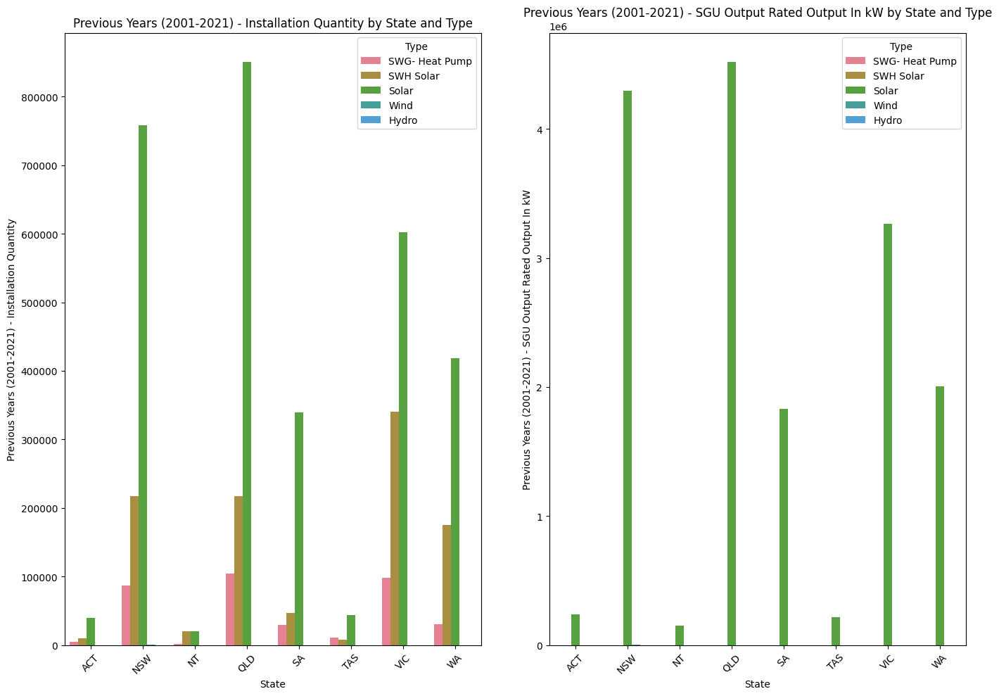

In [23]:

grouped = grouped.reset_index()


plt.figure(figsize=(20, 10))


sns.set_palette("husl")


plt.subplot(1, 3, 2)
sns.barplot(data=grouped, x='State', y='Previous Years (2001-2021) - Installation Quantity', hue='Type')
plt.title('Previous Years (2001-2021) - Installation Quantity by State and Type')
plt.xticks(rotation=45)


plt.subplot(1, 3, 3)
sns.barplot(data=grouped, x='State', y='Previous Years (2001-2021) - SGU Output Rated Output In kW', hue='Type')
plt.title('Previous Years (2001-2021) - SGU Output Rated Output In kW by State and Type')
plt.xticks(rotation=45)


plt.tight_layout()


plt.show()

This gives us a good comparisons for solar,Solar water, and total kW for each sate but not for wind or hydro.

In [24]:
df_systems_combined_cleaned_wind = df_systems_combined_cleaned.loc[df_systems_combined_cleaned['Type'] == "Wind"]

grouped_wind = df_systems_combined_cleaned_wind.groupby(['State','Type']).aggregate({
    'Small Unit Installation Postcode':'count',
    'Previous Years (2001-2021) - Installation Quantity': 'sum',
    'Previous Years (2001-2021) - SGU Output Rated Output In kW':'sum'
    })

df_systems_combined_cleaned_hydro = df_systems_combined_cleaned.loc[df_systems_combined_cleaned['Type'] == "Hydro"]

grouped_hydro = df_systems_combined_cleaned_hydro.groupby(['State','Type']).aggregate({
    'Small Unit Installation Postcode':'count',
    'Previous Years (2001-2021) - Installation Quantity': 'sum',
    'Previous Years (2001-2021) - SGU Output Rated Output In kW':'sum'
    })



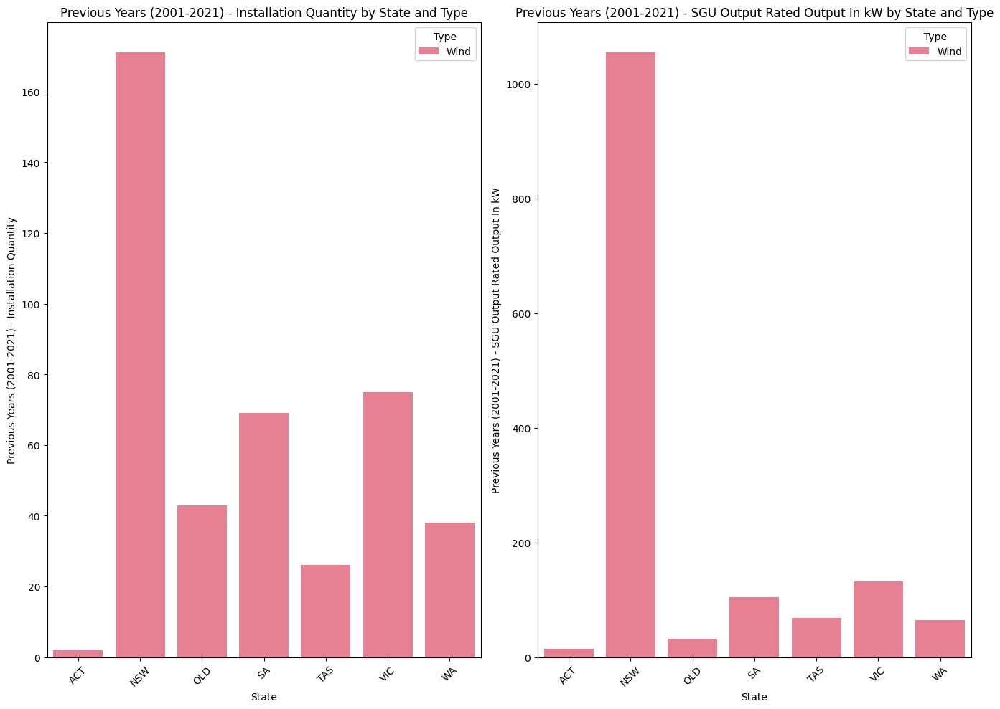

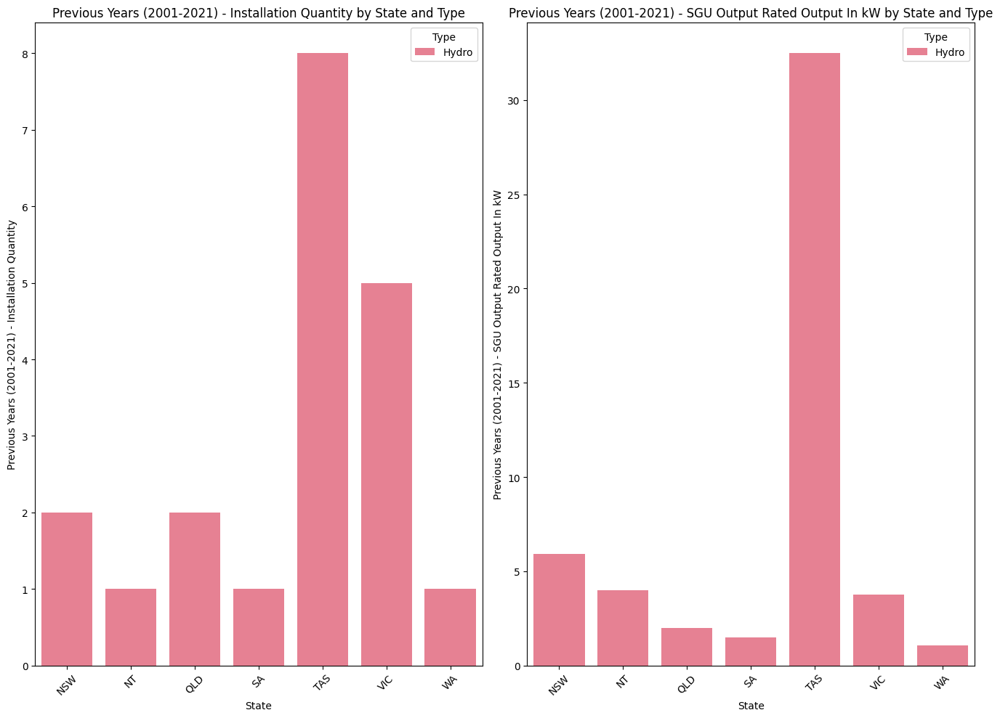

In [25]:
grouped_wind = grouped_wind.reset_index()
grouped_hydro = grouped_hydro.reset_index()

plt.figure(figsize=(20, 10))
sns.set_palette("husl")

plt.subplot(1, 3, 2)
sns.barplot(data=grouped_wind, x='State', y='Previous Years (2001-2021) - Installation Quantity', hue='Type')
plt.title('Previous Years (2001-2021) - Installation Quantity by State and Type')
plt.xticks(rotation=45)

plt.subplot(1, 3, 3)
sns.barplot(data=grouped_wind, x='State', y='Previous Years (2001-2021) - SGU Output Rated Output In kW', hue='Type')
plt.title('Previous Years (2001-2021) - SGU Output Rated Output In kW by State and Type')
plt.xticks(rotation=45)


plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


grouped_wind = grouped_wind.reset_index()
grouped_hydro = grouped_hydro.reset_index()

plt.figure(figsize=(20, 10))
sns.set_palette("husl")

plt.subplot(1, 3, 2)
sns.barplot(data=grouped_hydro, x='State', y='Previous Years (2001-2021) - Installation Quantity', hue='Type')
plt.title('Previous Years (2001-2021) - Installation Quantity by State and Type')
plt.xticks(rotation=45)

plt.subplot(1, 3, 3)
sns.barplot(data=grouped_hydro, x='State', y='Previous Years (2001-2021) - SGU Output Rated Output In kW', hue='Type')
plt.title('Previous Years (2001-2021) - SGU Output Rated Output In kW by State and Type')
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8 entries, 0 to 7
Data columns (total 2 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   State                8 non-null      object
 1   Total Installations  8 non-null      int64 
dtypes: int64(1), object(1)
memory usage: 256.0+ bytes
  State  Total Installations
0   ACT                 3410
1  NSW                 16717
2   NT                  1494
3  QLD                 12933
4   SA                 16802
5  TAS                   993
6  VIC                 16396
7    WA                 7372


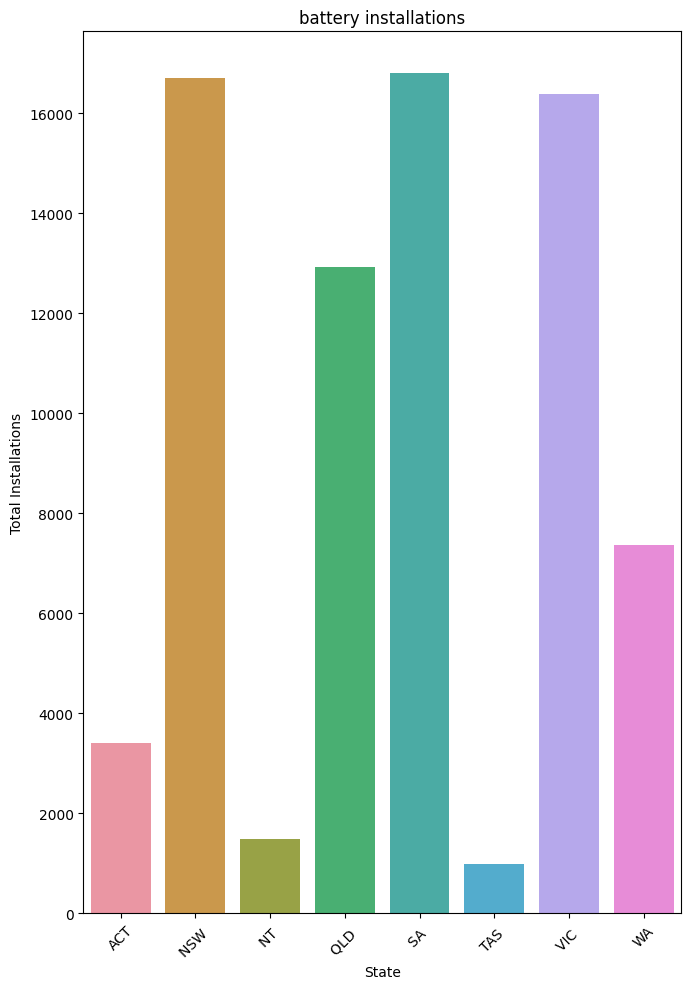

In [26]:
df_battery_installations

df_battery_installations2 = df_battery_installations.melt(id_vars=['Installation year'], value_vars=df_battery_installations.columns[1:-1], var_name='State', value_name='Total Installations')


df_battery_installations2 = pd.DataFrame(df_battery_installations2)
df_battery_installations2 = df_battery_installations2.replace(',','', regex=True)
df_battery_installations2['Total Installations'] = pd.to_numeric(df_battery_installations2['Total Installations'], errors='coerce')


df_battery_installations3 = df_battery_installations2.groupby(by='State').aggregate({
    'Total Installations':'sum',
    }).reset_index()


df_battery_installations3.info()
print(df_battery_installations3)

plt.figure(figsize=(20, 10))
sns.set_palette("husl")

plt.subplot(1, 3, 2)
sns.barplot(data=df_battery_installations3, x='State', y='Total Installations')
plt.title('battery installations')
plt.xticks(rotation=45)

plt.xticks(rotation=45)
plt.tight_layout()
plt.show()




## Time series

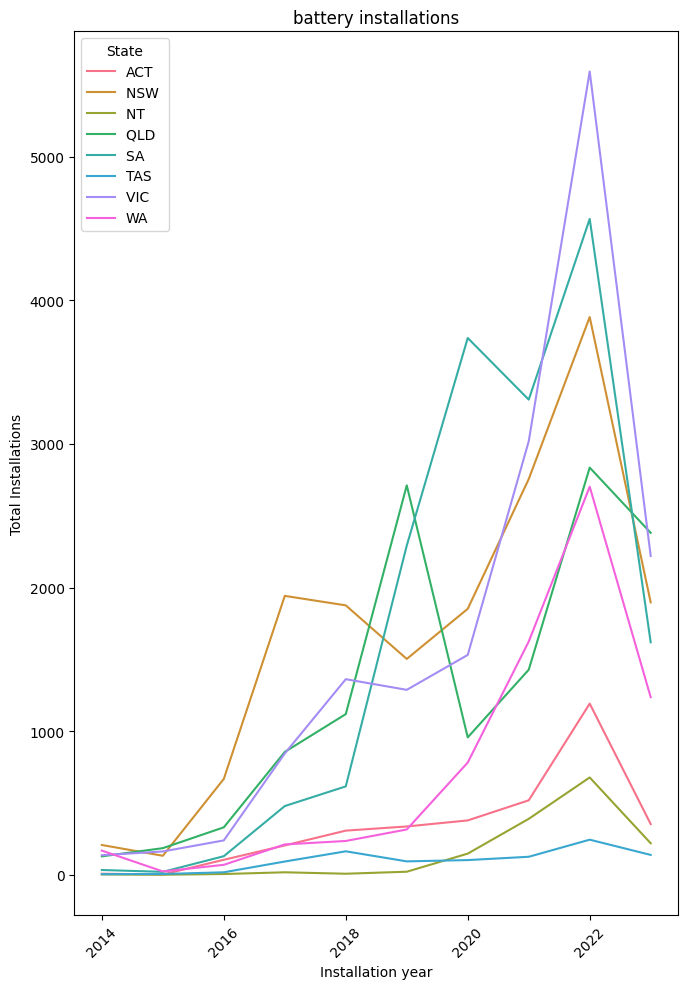

In [27]:
#print(df_battery_installations2.to_markdown())

plt.figure(figsize=(20, 10))
sns.set_palette("husl")

plt.subplot(1, 3, 2)
sns.lineplot(data=df_battery_installations2, x='Installation year', y='Total Installations',hue='State')
plt.title('battery installations')
plt.xticks(rotation=45)

plt.xticks(rotation=45)
#plt.yscale("log")
plt.tight_layout()
plt.show()



/tmp/ipykernel_132722/492453417.py:7: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=df_battery_installations2, x='Installation year', y='Total Installations', hue='State', estimator='mean', ci=None)


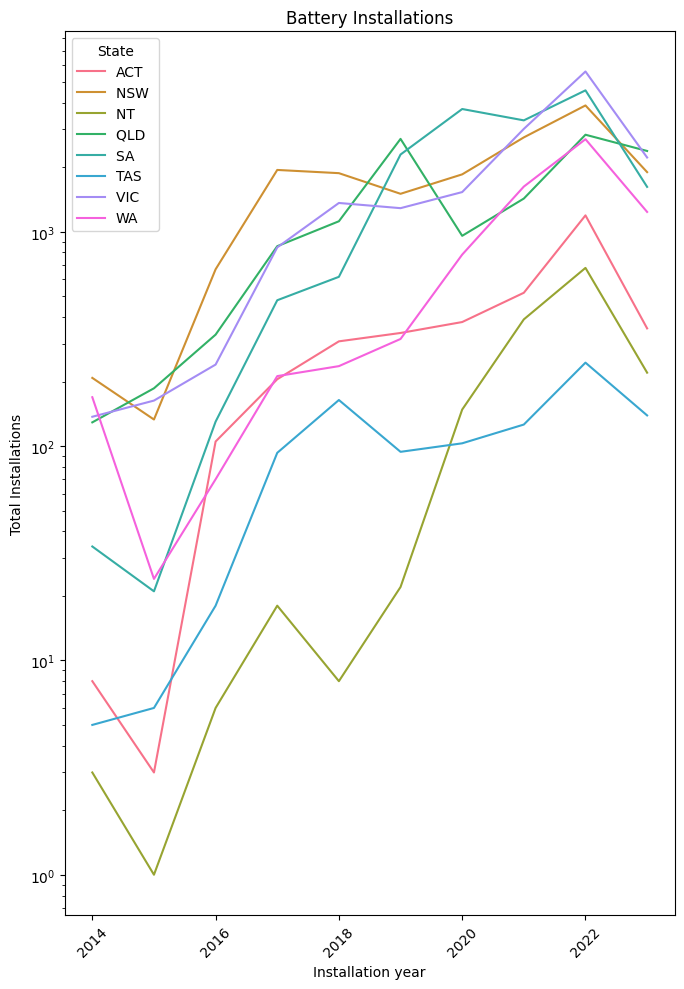

In [28]:
plt.figure(figsize=(20, 10))
sns.set_palette("husl")

plt.subplot(1, 3, 2)

# Smooth trend lines
sns.lineplot(data=df_battery_installations2, x='Installation year', y='Total Installations', hue='State', estimator='mean', ci=None)

plt.title('Battery Installations')
plt.xticks(rotation=45)

plt.yscale("log")

plt.tight_layout()
plt.show()

Merge the dataframes that have monthly columns, wind and hydro do not so just leaves solar and the 2 SWH dataframes

In [29]:
# stage 1) prep dataframes for combine

df_SSI_SWH_Air_source_heat_pump["Previous Years (2001-2021) - SGU Output Rated Output In kW"] = None
df_SSI_SWH_Air_source_heat_pump["Jan 2022 - SGU Rated Output In kW"] = None
df_SSI_SWH_Air_source_heat_pump["Feb 2022 - SGU Rated Output In kW"] = None
df_SSI_SWH_Air_source_heat_pump["Mar 2022 - SGU Rated Output In kW"] = None
df_SSI_SWH_Air_source_heat_pump["Apr 2022 - SGU Rated Output In kW"] = None
df_SSI_SWH_Air_source_heat_pump["May 2022 - SGU Rated Output In kW"] = None
df_SSI_SWH_Air_source_heat_pump["Jun 2022 - SGU Rated Output In kW"] = None
df_SSI_SWH_Air_source_heat_pump["Jul 2022 - SGU Rated Output In kW"] = None
df_SSI_SWH_Air_source_heat_pump["Aug 2022 - SGU Rated Output In kW"] = None
df_SSI_SWH_Air_source_heat_pump["Sep 2022 - SGU Rated Output In kW"] = None
df_SSI_SWH_Air_source_heat_pump["Oct 2022 - SGU Rated Output In kW"] = None
df_SSI_SWH_Air_source_heat_pump["Nov 2022 - SGU Rated Output In kW"] = None
df_SSI_SWH_Air_source_heat_pump["Dec 2022 - SGU Rated Output In kW"] = None
df_SSI_SWH_Air_source_heat_pump["Jan 2023 - SGU Rated Output In kW"] = None
df_SSI_SWH_Air_source_heat_pump["Feb 2023 - SGU Rated Output In kW"] = None
df_SSI_SWH_Air_source_heat_pump["Mar 2023 - SGU Rated Output In kW"] = None
df_SSI_SWH_Air_source_heat_pump["Apr 2023 - SGU Rated Output In kW"] = None
df_SSI_SWH_Air_source_heat_pump["May 2023 - SGU Rated Output In kW"] = None
df_SSI_SWH_Air_source_heat_pump["Jun 2023 - SGU Rated Output In kW"] = None
df_SSI_SWH_Air_source_heat_pump["SGU Rated Output In kW Total"] = None

df_SSI_SWH_Solar["Previous Years (2001-2021) - SGU Output Rated Output In kW"] = None
df_SSI_SWH_Solar["Jan 2022 - SGU Rated Output In kW"] = None
df_SSI_SWH_Solar["Feb 2022 - SGU Rated Output In kW"] = None
df_SSI_SWH_Solar["Mar 2022 - SGU Rated Output In kW"] = None
df_SSI_SWH_Solar["Apr 2022 - SGU Rated Output In kW"] = None
df_SSI_SWH_Solar["May 2022 - SGU Rated Output In kW"] = None
df_SSI_SWH_Solar["Jun 2022 - SGU Rated Output In kW"] = None
df_SSI_SWH_Solar["Jul 2022 - SGU Rated Output In kW"] = None
df_SSI_SWH_Solar["Aug 2022 - SGU Rated Output In kW"] = None
df_SSI_SWH_Solar["Sep 2022 - SGU Rated Output In kW"] = None
df_SSI_SWH_Solar["Oct 2022 - SGU Rated Output In kW"] = None
df_SSI_SWH_Solar["Nov 2022 - SGU Rated Output In kW"] = None
df_SSI_SWH_Solar["Dec 2022 - SGU Rated Output In kW"] = None
df_SSI_SWH_Solar["Jan 2023 - SGU Rated Output In kW"] = None
df_SSI_SWH_Solar["Feb 2023 - SGU Rated Output In kW"] = None
df_SSI_SWH_Solar["Mar 2023 - SGU Rated Output In kW"] = None
df_SSI_SWH_Solar["Apr 2023 - SGU Rated Output In kW"] = None
df_SSI_SWH_Solar["May 2023 - SGU Rated Output In kW"] = None
df_SSI_SWH_Solar["Jun 2023 - SGU Rated Output In kW"] = None
df_SSI_SWH_Solar["SGU Rated Output In kW Total"] = None

df_SSI_SWH_Solar['Type'] ="SWH-Solar"
df_SSI_SWH_Air_source_heat_pump['Type'] = "SWG- Heat Pump"
df_SSI_SGU_Solar['Type'] = "Solar"

print(df_SSI_SWH_Air_source_heat_pump.shape)
print(df_SSI_SWH_Solar.shape)
print(df_SSI_SGU_Solar.shape)

df_SSI_SGU_Solar.rename(columns={' Installations Quantity Total ': 'Installations Quantity Total'}, inplace=True)

df_systems_monthly = pd.concat([df_SSI_SWH_Air_source_heat_pump,df_SSI_SWH_Solar,df_SSI_SGU_Solar])
print(df_systems_monthly.shape)


# stage 2 ) Add in postcode data

df_systems_monthly = df_systems_monthly.merge(df_AU_postcode_dataset_small, how='left', left_on='Small Unit Installation Postcode', right_on='Postcode')
df_systems_monthly.isnull().sum()

# stage 3) Remove blank rows

df_systems_monthly = df_systems_monthly[~df_systems_monthly.Postcode.isnull()]
df_systems_monthly
df_systems_monthly.isnull().sum()

(2610, 42)
(2964, 42)
(2806, 42)
(8380, 42)


Small Unit Installation Postcode                                 0
Previous Years (2001-2021) - Installation Quantity               0
Jan 2022 - Installations Quantity                                0
Feb 2022 - Installations Quantity                                0
Mar 2022 - Installations Quantity                                0
Apr 2022 - Installations Quantity                                0
May 2022 - Installations Quantity                                0
Jun 2022 - Installations Quantity                                0
Jul 2022 - Installations Quantity                                0
Aug 2022 - Installations Quantity                                0
Sep 2022 - Installations Quantity                                0
Oct 2022 - Installations Quantity                                0
Nov 2022 - Installations Quantity                                0
Dec 2022 - Installations Quantity                                0
Jan 2023 - Installations Quantity                             

In [30]:
# stage 4) Remove columns not needed

# check existing columns
df_systems_monthly.columns

# Drop columns not needed
df_systems_monthly_small = df_systems_monthly.drop(columns=[
    'Installations Quantity Total',
    'SGU Rated Output In kW Total',
    'Small Unit Installation Postcode',
    'Electorate Rating'
    ])

# check columns
df_systems_monthly_small.columns

# step1 ) filter by type = Solar
df_systems_monthly_small_solar = df_systems_monthly_small.loc[df_systems_monthly_small['Type'] == "Solar"]

# step2) rename previous years installation quanity to < 2021 Installation Quantity
df_systems_monthly_small_solar.rename(columns={'Previous Years (2001-2021) - Installation Quantity': '< 2022 Quantity'}, inplace=True)
df_systems_monthly_small_solar.rename(columns={'Previous Years (2001-2021) - SGU Output Rated Output In kW': '< 2022 KW'}, inplace=True)


# step3) create new columns called 2022 Quantity and 2022 KW and calculate them from the monthly columns
df_systems_monthly_small_solar['2022 Quantity'] = df_systems_monthly_small_solar.iloc[:, 1:13].sum(axis=1)
df_systems_monthly_small_solar['2023 Quantity'] = df_systems_monthly_small_solar.iloc[:, 13:19].sum(axis=1)
df_systems_monthly_small_solar['2022 KW'] = df_systems_monthly_small_solar.iloc[:, 20:32].sum(axis=1)
df_systems_monthly_small_solar['2023 KW'] = df_systems_monthly_small_solar.iloc[:, 32:38].sum(axis=1)

# step4) Remove all columns that are not LGA Region | State  | < 2022 Quantity | < 2022 KW | 2022 Quantity | 2023 Quantity| 2022 KW | 2023 KW | lat | long
df_systems_monthly_small_solar_all = df_systems_monthly_small_solar
df_systems_monthly_small_solar = df_systems_monthly_small_solar[['LGA Region','< 2022 Quantity','< 2022 KW','State', '2022 Quantity', '2023 Quantity', '2022 KW', '2023 KW', 'Lat', 'Long']]

# step5) group by LGA region and sum the values but average lat and long and get first state value
df_systems_monthly_small_solar = df_systems_monthly_small_solar.groupby(by='LGA Region').aggregate({
    'State':'first',
    '< 2022 Quantity':'sum',
    '< 2022 KW':'sum',
    '2022 Quantity':'sum',
    '2022 KW':'sum',
    '2023 Quantity':'sum',
    '2023 KW':'mean',
    'Lat':'mean',
    'Long':'mean'
})

df_systems_monthly_small_solar.head()


/tmp/ipykernel_132722/795502276.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_systems_monthly_small_solar.rename(columns={'Previous Years (2001-2021) - Installation Quantity': '< 2022 Quantity'}, inplace=True)
/tmp/ipykernel_132722/795502276.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_systems_monthly_small_solar.rename(columns={'Previous Years (2001-2021) - SGU Output Rated Output In kW': '< 2022 KW'}, inplace=True)
/tmp/ipykernel_132722/795502276.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value inste

,State,< 2022 Quantity,< 2022 KW,2022 Quantity,2022 KW,2023 Quantity,2023 KW,Lat,Long
LGA Region,,,,,,,,,
Adelaide,SA,1710,15978.091,144,2045.700,56,428.155000,-34.924491,138.596567
Adelaide Hills,SA,3531,24455.283,257,2798.430,109,90.602308,-34.890148,138.853593
Adelaide Plains,SA,582,3564.689,37,311.495,12,62.602500,-34.404307,138.570413
Albany,WA,3841,17177.007,381,2983.095,141,359.535000,-34.950475,118.070029
Albury,NSW,9018,51571.384,1092,9227.597,448,959.848750,-36.018909,146.875826


LGA on geo map

In [31]:

# output 1


# Initializing the map focused on Australia's coordinates
m = folium.Map(location=[-25.2744, 133.7751], zoom_start=5)

# Looping over each row in the dataframe to add multiple overlapping circles for each LGA region
for idx, row in df_systems_monthly_small_solar.iterrows():
    location = [row['Lat'], row['Long']]
    # '< 2022 KW' ring
    folium.Circle(
        location=location,
        radius=row['< 2022 KW']/10,
        color='blue',
        fill=True,
        fill_color='blue',
        fill_opacity=0.6
    ).add_to(m)

    # '2022 KW' ring
    folium.Circle(
        location=location,
        radius=row['2022 KW']/10,
        color='green',
        fill=True,
        fill_color='green',
        fill_opacity=0.6
    ).add_to(m)

    # '2023 KW' ring
    folium.Circle(
        location=location,
        radius=row['2023 KW']/10,
        color='red',
        fill=True,
        fill_color='red',
        fill_opacity=0.6
    ).add_to(m)


    legend_html = """
<div style="position: fixed; 
            bottom: 50px; left: 50px; width: 120px; height: 90px; 
            border:2px solid grey; z-index:9999; font-size:14px;
            background-color: white;
            ">
    &nbsp;<b>Legend</b><br>
    &nbsp;<i class="fa-circle fa-stack-2x" style="color:blue"></i> < 2022 KW<br>
    &nbsp;<i class="fa-circle fa-stack-2x" style="color:green"></i> 2022 KW<br>
    &nbsp;<i class="fa-circle fa-stack-2x" style="color:red"></i> 2023 KW
</div>
""" 

m.get_root().html.add_child(folium.Element(legend_html))

# Displaying the map
m



Top solar production by LGA report

In [32]:
# output 2) Top solar production by LGA

# sort by 2023 kw, descending
df_systems_monthly_small_solar = df_systems_monthly_small_solar.sort_values(by=['2023 KW'], ascending=False)

# format all numeric columns execpt lat and long to 1 decimal place
df_systems_monthly_small_solar[['< 2022 Quantity','< 2022 KW','2022 Quantity','2022 KW','2023 Quantity','2023 KW']] = df_systems_monthly_small_solar[['< 2022 Quantity','< 2022 KW','2022 Quantity','2022 KW','2023 Quantity','2023 KW']].applymap('{:,.1f}'.format)

# show only the top 50 rows
df_systems_monthly_small_solar = df_systems_monthly_small_solar.head(50)

# display dataframe with all rows and columns
pd.set_option('display.max_rows', None)
df_systems_monthly_small_solar


,State,< 2022 Quantity,< 2022 KW,2022 Quantity,2022 KW,2023 Quantity,2023 KW,Lat,Long
LGA Region,,,,,,,,,
Orange,NSW,"6,029.0","38,656.0",875.0,"6,777.4",330.0,"2,859.6",-33.233929,149.116263
Lismore,NSW,"9,858.0","49,512.1",710.0,"5,935.0",329.0,"2,773.8",-28.706486,153.259430
Goulburn Mulwaree,NSW,"3,536.0","20,596.6",409.0,"3,918.3",439.0,"2,756.9",-34.726283,149.729215
Blacktown,NSW,"53,781.0","308,069.5","7,780.0","70,328.6","3,346.0","2,591.2",-33.736080,150.887153
Oberon,NSW,"5,595.0","34,857.4",770.0,"6,787.4",279.0,"2,317.5",-33.820797,149.474401
Wyndham,VIC,"32,287.0","184,279.3","3,537.0","30,639.3","1,381.0","2,262.5",-37.880073,144.576586
Singleton,NSW,"2,923.0","20,157.7",291.0,"2,939.8",185.0,"2,195.7",-32.760486,150.972137
Gympie,QLD,"11,121.0","56,936.9",913.0,"8,610.7",458.0,"1,957.0",-26.104465,152.419012
Cessnock,NSW,"3,814.0","21,991.0",507.0,"4,679.6",201.0,"1,949.4",-32.977861,151.317476


In [33]:

# filter by type = Solar
df_systems_monthly_small_solar_all = df_systems_monthly_small_solar_all.loc[df_systems_monthly_small_solar_all['Type'] == "Solar"]

# remove all of the quanity columns
df_systems_monthly_small_solar_all = df_systems_monthly_small_solar_all.drop(columns=[  
    'Jan 2022 - Installations Quantity',
    'Feb 2022 - Installations Quantity',
    'Mar 2022 - Installations Quantity',
    'Apr 2022 - Installations Quantity',
    'May 2022 - Installations Quantity',
    'Jun 2022 - Installations Quantity',
    'Jul 2022 - Installations Quantity',
    'Aug 2022 - Installations Quantity',
    'Sep 2022 - Installations Quantity',
    'Oct 2022 - Installations Quantity',
    'Nov 2022 - Installations Quantity',
    'Dec 2022 - Installations Quantity',
    'Jan 2023 - Installations Quantity',
    'Feb 2023 - Installations Quantity',
    'Mar 2023 - Installations Quantity',
    'Apr 2023 - Installations Quantity',
    'May 2023 - Installations Quantity',
    'Jun 2023 - Installations Quantity',
    '< 2022 KW',
    '< 2022 Quantity',
    'Type',
    'Postcode',
    'Long', 
    'Lat', 
    'LGA Region', 
    '2022 Quantity', 
    '2023 Quantity',
    '2022 KW',
    '2023 KW'

    ])

In [34]:
df_systems_monthly_small_solar_all

# rename columns
df_systems_monthly_small_solar_all.rename(columns={'Jan 2022 - SGU Rated Output In kW': 'Jan 2022'}, inplace=True)
df_systems_monthly_small_solar_all.rename(columns={'Feb 2022 - SGU Rated Output In kW': 'Feb 2022'}, inplace=True)
df_systems_monthly_small_solar_all.rename(columns={'Mar 2022 - SGU Rated Output In kW': 'Mar 2022'}, inplace=True)
df_systems_monthly_small_solar_all.rename(columns={'Apr 2022 - SGU Rated Output In kW': 'Apr 2022'}, inplace=True)
df_systems_monthly_small_solar_all.rename(columns={'May 2022 - SGU Rated Output In kW': 'May 2022'}, inplace=True)
df_systems_monthly_small_solar_all.rename(columns={'Jun 2022 - SGU Rated Output In kW': 'Jun 2022'}, inplace=True)
df_systems_monthly_small_solar_all.rename(columns={'Jul 2022 - SGU Rated Output In kW': 'Jul 2022'}, inplace=True)
df_systems_monthly_small_solar_all.rename(columns={'Aug 2022 - SGU Rated Output In kW': 'Aug 2022'}, inplace=True)
df_systems_monthly_small_solar_all.rename(columns={'Sep 2022 - SGU Rated Output In kW': 'Sep 2022'}, inplace=True)
df_systems_monthly_small_solar_all.rename(columns={'Oct 2022 - SGU Rated Output In kW': 'Oct 2022'}, inplace=True)
df_systems_monthly_small_solar_all.rename(columns={'Nov 2022 - SGU Rated Output In kW': 'Nov 2022'}, inplace=True)
df_systems_monthly_small_solar_all.rename(columns={'Dec 2022 - SGU Rated Output In kW': 'Dec 2022'}, inplace=True)
df_systems_monthly_small_solar_all.rename(columns={'Jan 2023 - SGU Rated Output In kW': 'Jan 2023'}, inplace=True)
df_systems_monthly_small_solar_all.rename(columns={'Feb 2023 - SGU Rated Output In kW': 'Feb 2023'}, inplace=True)
df_systems_monthly_small_solar_all.rename(columns={'Mar 2023 - SGU Rated Output In kW': 'Mar 2023'}, inplace=True)
df_systems_monthly_small_solar_all.rename(columns={'Apr 2023 - SGU Rated Output In kW': 'Apr 2023'}, inplace=True)
df_systems_monthly_small_solar_all.rename(columns={'May 2023 - SGU Rated Output In kW': 'May 2023'}, inplace=True)
df_systems_monthly_small_solar_all.rename(columns={'Jun 2023 - SGU Rated Output In kW': 'Jun 2023'}, inplace=True)


# group by state and sum the values
df_systems_monthly_small_solar_all = df_systems_monthly_small_solar_all.groupby(by='State').aggregate({
    'Jan 2022':'sum',
    'Feb 2022':'sum',
    'Mar 2022':'sum',
    'Apr 2022':'sum',
    'May 2022':'sum',
    'Jun 2022':'sum',
    'Jul 2022':'sum',
    'Aug 2022':'sum',
    'Sep 2022':'sum',
    'Oct 2022':'sum',
    'Nov 2022':'sum',
    'Dec 2022':'sum',
    'Jan 2023':'sum',
    'Feb 2023':'sum',
    'Mar 2023':'sum',
    'Apr 2023':'sum',
    'May 2023':'sum',
    'Jun 2023':'sum'

    })

df_systems_monthly_small_solar_all


,Jan 2022,Feb 2022,Mar 2022,Apr 2022,May 2022,Jun 2022,Jul 2022,Aug 2022,Sep 2022,Oct 2022,Nov 2022,Dec 2022,Jan 2023,Feb 2023,Mar 2023,Apr 2023,May 2023,Jun 2023
State,,,,,,,,,,,,,,,,,,
ACT,4296.435,6171.950,7009.325,5083.430,6619.065,7080.375,6612.510,7450.430,7610.910,7138.670,9534.665,9607.060,4982.085,7281.570,7700.010,5498.535,6817.865,3775.925
NSW,41022.782,59661.423,59019.999,53450.558,62447.589,75487.640,66767.488,85589.425,73979.737,69963.860,96847.504,105553.718,49125.221,70992.241,75880.085,62322.796,77148.782,49696.405
NT,714.970,941.390,2063.430,1368.250,1670.525,1670.710,1690.360,1793.145,1483.150,1683.330,1776.820,1776.565,733.180,969.250,1144.060,850.040,711.685,234.705
QLD,36239.730,50119.875,59175.143,49508.841,50579.393,66151.625,58125.062,66757.951,61483.764,60650.621,76038.172,77638.127,44802.667,59086.953,63757.701,48294.755,58648.500,41680.013
SA,12901.982,19259.732,20802.743,17358.473,18762.045,20259.500,22349.363,22729.435,21389.158,21463.579,27962.115,30318.358,15172.959,19203.807,20230.199,15674.193,17798.810,12110.035
TAS,1389.515,2609.725,2679.420,1939.140,3059.007,2518.330,3079.535,3066.958,3090.416,2578.375,4204.908,4066.622,2377.230,3756.855,3985.595,2945.162,3553.235,1839.645
VIC,24097.864,39692.867,45082.381,34588.229,39884.055,39839.963,46455.900,50646.243,50083.313,44551.064,55246.669,64611.127,34100.583,46741.818,44994.975,34906.863,39277.946,13851.740
WA,18230.583,24657.295,27499.052,20148.160,21517.695,22732.805,21360.460,23534.790,21898.820,25589.555,28355.262,28710.815,18808.435,22706.445,23024.600,18243.855,20836.280,11830.755


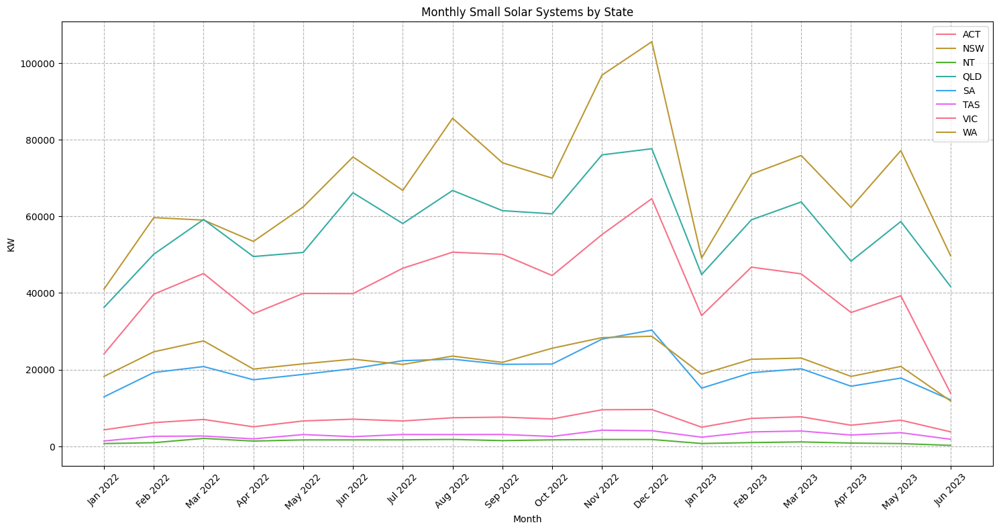

In [35]:
# plot a line graph where each line respresents a state
plt.figure(figsize=(15,8))
for state in df_systems_monthly_small_solar_all.index:
    df_systems_monthly_small_solar_all.loc[state].plot(label=state)

plt.title("Monthly Small Solar Systems by State")
plt.xlabel("Month")
plt.ylabel("KW")
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()

# Set all month labels on the x-axis
plt.xticks(range(len(df_systems_monthly_small_solar_all.columns)), df_systems_monthly_small_solar_all.columns, rotation=45)

plt.grid(True, which="both", ls="--", c='0.7')
plt.show()